# Classification

Let's try to do some classification.

In [1]:
%matplotlib inline
import matplotlib.pylab as plt
import IPython.display as ipd
import numpy as np
import pandas as pd
import scipy
import sklearn
import librosa
import librosa.display
from ast import literal_eval
from joblib import Parallel, delayed
from tqdm import tqdm
import seaborn as sns

np.random.seed(37)

# Read in the CSV

You need got to run the `explore-data.ipynb` which exports the file `recording.csv`. 

In [2]:
recording_df = pd.read_csv('recording.csv', converters={'types': literal_eval})

In [3]:
recording_df.head(5)

,id,state,en,sp,ssp,gen,lat,lng,types,mp3,mp3_size,duration
0,408991,michigan,black-capped chickadee,atricapillus,atricapillus,poecile,42.1696,-84.2051,[call],./mp3/408991.mp3,1056878,26.319550
1,408988,michigan,black-capped chickadee,atricapillus,atricapillus,poecile,42.1696,-84.2051,[call],./mp3/408988.mp3,1718318,42.855550
2,407827,new york,black-capped chickadee,atricapillus,NaN,poecile,42.0330,-79.4222,[song],./mp3/407827.mp3,281570,17.342125
3,406662,illinois,black-capped chickadee,atricapillus,NaN,poecile,41.3260,-89.8926,[song],./mp3/406662.mp3,3878909,96.810275
4,394059,new jersey,black-capped chickadee,atricapillus,NaN,poecile,40.7958,-74.0492,"[alarm call, call, flight call]",./mp3/394059.mp3,154378,7.272000


# Determine the classes

Let's see which classes will be good for testing classification. Here, we will use the `species name` as the class labels. However, we will only choose 2 classes to do this simple binary classification exercise. By sheer luck, the `wollweberi` and `quiscula` species have exactly 100 samples each. We will take `wollweberi` as the `0` class and `quiscula` as the `1` class. Note that we only look at samples according to the following criteria.

* sample must be a `call` or `song`
* sample must be less than 60 seconds
* sample must be less than 1 MB

In [4]:
s = recording_df[recording_df['sp'].notnull()]['sp'].value_counts()

In [5]:
s[s == 100]

wollweberi    100
quiscula      100
Name: sp, dtype: int64

In [6]:
def filter_row(r):
    if 'call' in r['types'] or 'song' in r['types']:
        if 'wollweberi' == r['sp'] or 'quiscula' == r['sp']:
            if 0 < r['duration'] <= 60.0:
                if 0 < r['mp3_size'] / float(1024 * 1024) <= 1.0:
                    return True
    return False

samples_df = recording_df[recording_df.apply(lambda r: filter_row(r), axis=1)]

In [7]:
samples_df['sp'].value_counts()

wollweberi    79
quiscula      54
Name: sp, dtype: int64

# Plot some spectrograms

In [8]:
def show_audio(df):
    for i in range(10):
        r = df.iloc[i]
        fname = r['mp3']
        gen = r['gen']
        sp = r['sp']
        title = '{}, {}, {}'.format(gen, sp, fname)
        y, sr = librosa.load(fname)
        
        ipd.display(ipd.Audio(fname))

def plot_melspectrogram(df):
    fig, ax = plt.subplots(5, 2, figsize=(15, 10), sharex=False, sharey=False)
    for i, axis in enumerate(np.ravel(ax)):
        r = df.iloc[i]
        fname = r['mp3']
        gen = r['gen']
        sp = r['sp']
        title = '{}, {}, {}'.format(gen, sp, fname)
        y, sr = librosa.load(fname)
        
        S = librosa.feature.melspectrogram(y, sr=sr, n_fft=2048, hop_length=512)
        logS = librosa.amplitude_to_db(S)
        librosa.display.specshow(logS, sr=sr, x_axis='time', y_axis='mel', ax=axis)
        
        axis.set_title(title)
    plt.tight_layout()

## Wollweberi spectrograms

In [9]:
show_audio(samples_df.query("sp == 'wollweberi'"))

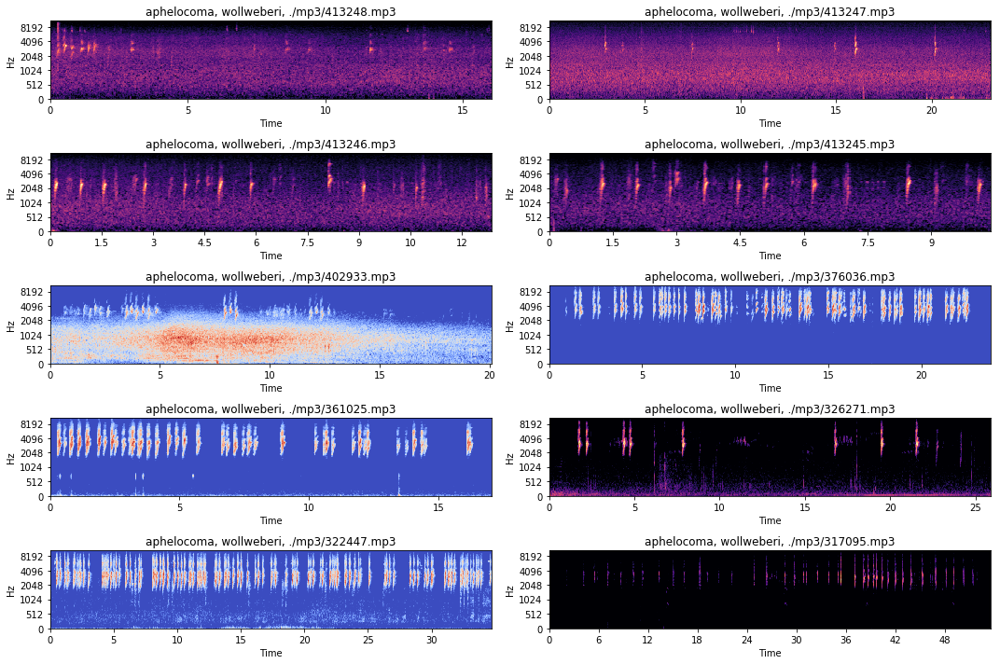

In [10]:
plot_melspectrogram(samples_df.query("sp == 'wollweberi'"))

## Quiscula spectrograms

In [11]:
show_audio(samples_df.query("sp == 'quiscula'"))

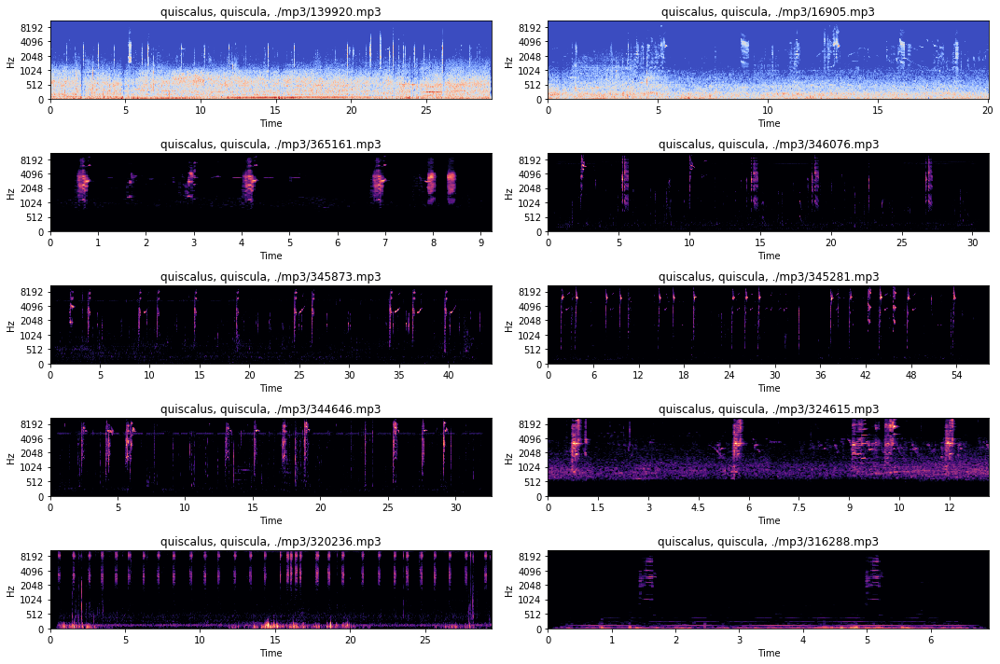

In [12]:
plot_melspectrogram(samples_df.query("sp == 'quiscula'"))

# Learn models based on chroma features

## Extract chroma features

Here, we extract features.

In [13]:
def get_features(fname, n_mfcc=12, duration=60.0):
    y, sr = librosa.load(fname, duration=duration)
    
    mfcc = librosa.feature.mfcc(y, sr=sr, n_mfcc=n_mfcc).T
    stft = librosa.feature.chroma_stft(y, sr=sr).T
    cqt = librosa.feature.chroma_cqt(y, sr=sr, n_chroma=n_mfcc).T
    cens = librosa.feature.chroma_cens(y, sr=sr, n_chroma=n_mfcc).T
    poly = librosa.feature.poly_features(y, sr=sr, order=n_mfcc - 1).T
    
    scaler = sklearn.preprocessing.StandardScaler()
    mfcc = scaler.fit_transform(mfcc)
    
    return np.hstack((mfcc, stft, cqt, cens, poly))

In [14]:
w_features = []
for i, r in tqdm(samples_df.query("sp == 'wollweberi'").iterrows()):
    features = get_features(r['mp3'])
    w_features.extend(features)
w_features = np.reshape(w_features, (len(w_features), 12*5))

79it [02:43,  2.07s/it]


In [15]:
q_features = []
for i, r in tqdm(samples_df.query("sp == 'quiscula'").iterrows()):
    features = get_features(r['mp3'])
    q_features.extend(features)
q_features = np.reshape(q_features, (len(q_features), 12*5))

29it [01:04,  2.21s/it]/home/super/anaconda3/envs/ds/lib/python2.7/site-packages/librosa/core/pitch.py:145: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')
54it [01:57,  2.18s/it]


In [16]:
print('wollweberi shape {}'.format(w_features.shape))
print('quiscula shape {}'.format(q_features.shape))

wollweberi shape (95708, 60)
quiscula shape (69980, 60)


In [17]:
X = np.vstack([w_features, q_features])
y = np.concatenate([np.zeros(w_features.shape[0]), np.ones(q_features.shape[0])])

In [18]:
print(X.shape)
print(y.shape)
print(np.sum(y))

(165688, 60)
(165688,)
69980.0


## Learn a model and test it back on the same training data

In [19]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score
from sklearn.metrics import matthews_corrcoef, precision_score, recall_score
from sklearn.metrics import zero_one_loss
from sklearn.metrics import roc_auc_score, brier_score_loss

model = RandomForestClassifier(n_estimators=25)
model.fit(X, y)
y_pred = model.predict(X)

print(confusion_matrix(y, y_pred))
print('>')
print(accuracy_score(y, y_pred))
print(f1_score(y, y_pred))
print(matthews_corrcoef(y, y_pred))
print(precision_score(y, y_pred))
print(recall_score(y, y_pred))
print(zero_one_loss(y, y_pred))
print(roc_auc_score(y, model.predict_proba(X)[:,1]))
print(brier_score_loss(y, model.predict_proba(X)[:,1]))

[[95705     3]
 [    7 69973]]
>
0.9999396455989571
0.9999285489725342
0.9998763090513111
0.9999571281582257
0.9998999714204059
6.035440104290579e-05
0.9999999820832568
0.01267543817295157


## K-fold cross-validation

In [20]:
from sklearn.model_selection import StratifiedShuffleSplit

def get_model(name):
    if name == 'rf':
        return RandomForestClassifier(n_estimators=25, n_jobs=-1)
    if name == 'gb':
        return GradientBoostingClassifier()
    if name == 'lr':
        return LogisticRegression()
    if name == 'nn1':
        return MLPClassifier(hidden_layer_sizes=(10, 5, 3, 5, 10), shuffle=True, random_state=37, early_stopping=True)
    if name == 'nn2':
        return MLPClassifier(hidden_layer_sizes=(20, 30, 10, 5, 10, 30, 20), shuffle=True, random_state=37, early_stopping=True)
    return KNeighborsClassifier(n_jobs=-1)
                             
def kfcv(model_name, X, y, n_splits=10):
    print('running {}-fold cross validation for {}'.format(n_splits, model_name))
    scores = []
    test_size = 1 / float(n_splits)
    sss = StratifiedShuffleSplit(n_splits=n_splits, test_size=test_size, random_state=37)
    for train_index, test_index in sss.split(X, y):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model = get_model(model_name)
        model.fit(X_train, y_train)
        y_pred = model.predict_proba(X_test)[:,1]
        auc = roc_auc_score(y_test, y_pred)
        scores.append(auc)
        print('{}: {:.5f}'.format(len(scores), auc))
    avg = sum(scores) / float(len(scores))
    print('avg: {:.5f}'.format(avg))
    return scores

In [21]:
results = {}
for model_name in ['rf', 'gb', 'lr', 'nn2', 'knn']:
    results[model_name] = kfcv(model_name, X, y, n_splits=5)

running 5-fold cross validation for rf
1: 0.97494
2: 0.97606
3: 0.97575
4: 0.97435
5: 0.97470
avg: 0.97516
running 5-fold cross validation for gb
1: 0.88332
2: 0.88228
3: 0.88416
4: 0.87671
5: 0.88273
avg: 0.88184
running 5-fold cross validation for lr
1: 0.72478
2: 0.72457
3: 0.72788
4: 0.72270
5: 0.72335
avg: 0.72466
running 5-fold cross validation for nn2
1: 0.92206
2: 0.91329
3: 0.91131
4: 0.91089
5: 0.92913
avg: 0.91734
running 5-fold cross validation for knn
1: 0.94904
2: 0.95043
3: 0.94752
4: 0.94745
5: 0.94809
avg: 0.94851


In [22]:
def results_to_df(results):
    data = []
    for k, v in results.iteritems():
        for r in v:
            t = (k, r)
            data.append(t)
    return pd.DataFrame(data, columns=['model', 'performance'])

Text(0.5,1,'5-fold cross-validation AUC performances')

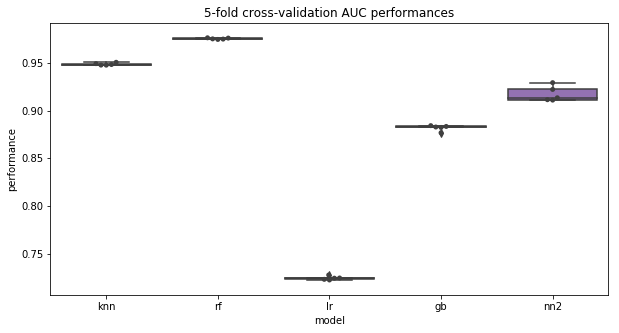

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
results_df = results_to_df(results)
sns.boxplot(x='model', y='performance', data=results_df, ax=ax)
sns.swarmplot(x='model', y='performance', data=results_df, color='0.25', ax=ax)
ax.set_title('5-fold cross-validation AUC performances')

# Learn models based on other spectral features

## Extract the features

In [24]:
def get_spectral_features(fname, duration=60.0):
    y, sr = librosa.load(fname, duration=duration)
    
    centroid = librosa.feature.spectral_centroid(y, sr=sr)
    bandwidth = librosa.feature.spectral_bandwidth(y, sr=sr)
    flatness = librosa.feature.spectral_flatness(y)
    rolloff = librosa.feature.spectral_rolloff(y, sr=sr)
    zcr = librosa.feature.zero_crossing_rate(y)
    
    return (centroid, bandwidth, flatness, rolloff, zcr)

In [25]:
w_features = []
for i, r in tqdm(samples_df.query("sp == 'wollweberi'").iterrows()):
    features = get_spectral_features(r['mp3'])
    w_features.append(features)

79it [01:47,  1.37s/it]


In [26]:
q_features = []
for i, r in tqdm(samples_df.query("sp == 'quiscula'").iterrows()):
    features = get_spectral_features(r['mp3'])
    q_features.append(features)

54it [01:17,  1.44s/it]


## Pad the features

Because the mp3 files are of different lengths, we need to pad them to be the same length. There is no scientific basis for the padding approach, but the approach taken is simply to padd each feature with its last value. 

In [27]:
def get_feature_length_profiles(features, fields = ['c', 'b', 'f', 'r', 'z']):
    d = { }
    for f in fields:
        d[f] = 0
    
    for f in features:
        for i, j in zip(range(5), fields):
            feature_length = len(f[i][0])
            if feature_length > d[j]:
                d[j] = feature_length
    return d

def get_padding_lengths(lhs_features, rhs_features, fields = ['c', 'b', 'f', 'r', 'z']):
    d = { }
    for f in fields:
        d[f] = 0
    
    lhs_profile = get_feature_length_profiles(lhs_features)
    rhs_profile = get_feature_length_profiles(rhs_features)
    
    for k, v in lhs_profile.iteritems():
        if v > d[k]:
            d[k] = v
    for k, v in rhs_profile.iteritems():
        if v > d[k]:
            d[k] = v
    
    return d

def pad_features(features, paddings):
    padded_features = []
    
    for t in features:
        c = t[0][0]
        b = t[1][0]
        f = t[2][0]
        r = t[3][0]
        z = t[4][0]
        
        pad_c = paddings['c'] - len(c)
        pad_b = paddings['b'] - len(b)
        pad_f = paddings['f'] - len(f)
        pad_r = paddings['r'] - len(r)
        pad_z = paddings['z'] - len(z)
        
        c = np.concatenate([c, np.full(pad_c, c[-1])])
        b = np.concatenate([b, np.full(pad_b, b[-1])])
        f = np.concatenate([f, np.full(pad_f, f[-1])])
        r = np.concatenate([r, np.full(pad_r, r[-1])])
        z = np.concatenate([z, np.full(pad_z, z[-1])])
        
        merged_feature = np.concatenate([c, b, f, r, z])
        merged_feature = merged_feature.reshape((1, len(merged_feature)))
        padded_features.append(merged_feature)
        
    return np.reshape(padded_features, (len(padded_features), padded_features[0].shape[1]))

In [28]:
paddings = get_padding_lengths(w_features, q_features)

In [29]:
w_pfeatures = pad_features(w_features, paddings)
q_pfeatures = pad_features(q_features, paddings)

In [30]:
X = np.vstack([w_pfeatures, q_pfeatures])
y = np.concatenate([np.zeros(w_pfeatures.shape[0]), np.ones(q_pfeatures.shape[0])])

print(X.shape)
print(y.shape)
print(np.sum(y))

(133, 12885)
(133,)
54.0


## Learn a model and test it back on the same training data

It's interesting to note that the random forest classifier is perfect but in k-fold cross-validation, the average area under the curve (AUC) performance is not that impressive.

In [31]:
model = RandomForestClassifier(n_estimators=25)
model.fit(X, y)
y_pred = model.predict(X)

print(confusion_matrix(y, y_pred))
print('>')
print(accuracy_score(y, y_pred))
print(f1_score(y, y_pred))
print(matthews_corrcoef(y, y_pred))
print(precision_score(y, y_pred))
print(recall_score(y, y_pred))
print(zero_one_loss(y, y_pred))
print(roc_auc_score(y, model.predict_proba(X)[:,1]))
print(brier_score_loss(y, model.predict_proba(X)[:,1]))

[[79  0]
 [ 0 54]]
>
1.0
1.0
1.0
1.0
1.0
0.0
1.0
0.03486315789473684


## K-fold cross-validation

In [32]:
results = {}
for model_name in ['rf', 'gb', 'lr', 'nn2', 'knn']:
    results[model_name] = kfcv(model_name, X, y, n_splits=10)

running 10-fold cross validation for rf
1: 0.81250
2: 0.75000
3: 0.92708
4: 0.56250
5: 0.72917
6: 0.53125
7: 0.37500
8: 0.67708
9: 0.76042
10: 0.76042
avg: 0.68854
running 10-fold cross validation for gb
1: 0.72917
2: 0.62500
3: 0.81250
4: 0.62500
5: 0.75000
6: 0.60417
7: 0.47917
8: 0.64583
9: 0.85417
10: 0.70833
avg: 0.68333
running 10-fold cross validation for lr
1: 0.31250
2: 0.56250
3: 0.70833
4: 0.50000
5: 0.77083
6: 0.83333
7: 0.68750
8: 0.77083
9: 0.89583
10: 0.62500
avg: 0.66667
running 10-fold cross validation for nn2
1: 0.50000
2: 0.50000
3: 0.50000
4: 0.50000
5: 0.50000
6: 0.50000
7: 0.43750
8: 0.50000
9: 0.50000
10: 0.50000
avg: 0.49375
running 10-fold cross validation for knn
1: 0.77083
2: 0.64583
3: 0.79167
4: 0.64583
5: 0.48958
6: 0.55208
7: 0.43750
8: 0.59375
9: 0.44792
10: 0.66667
avg: 0.60417


Text(0.5,1,'5-fold cross-validation AUC performances (padded features)')

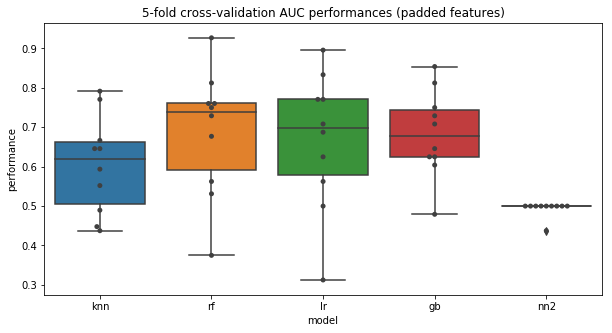

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
results_df = results_to_df(results)
sns.boxplot(x='model', y='performance', data=results_df, ax=ax)
sns.swarmplot(x='model', y='performance', data=results_df, color='0.25', ax=ax)
ax.set_title('5-fold cross-validation AUC performances (padded features)')

# Take a Look!

Take a look at [Dr. Abraham Wald](https://en.wikipedia.org/wiki/Abraham_Wald).